## Librerías

In [1]:
library(readxl)
library(ggplot2)
library(tidyr)
library(dplyr)
library(mice)
library(factoextra)
library(FactoMineR)
library(gridExtra)
library(plotly)
library(mltools)
library(ggstatsplot)
library(stringr)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘mice’


The following objects are masked from ‘package:base’:

    cbind, rbind


Welcome! Want to learn more? See two factoextra-related books at https://goo.gl/ve3WBa


Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine



Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout


The following object is masked from ‘package:httr’:

    config



Attaching package: ‘mltools’


The following object is masked from ‘package:tidyr’:

    replace_na


Registered S3 method overwritten by 'broom.mixed':
  method      from 
  tidy.gamlss broom

Regis

## Data

In [2]:
data <- read_excel('../input/lung-cancer-proyecto-iii/Base_inmunosenescencia_v10.xlsx', sheet = 1)
variables <- read_excel('../input/lung-cancer-proyecto-iii/Base_inmunosenescencia_v10.xlsx', sheet = 2)
tipo_1 <- c( "Neutrofilos", "Linf_tot", "Plaquetas", "LinfT_cel", "CD4_cel", "CD8_cel", "CD4:CD8", "LinfB_cel", "LinfNK_cel", 
  "HLADR+Lin_C_Leuc", "mDC_C_Leuc", "pDC_C_Leuc", "CD4_Central_Mem_C_Linf", "CD4_Effector_Mem_C_Linf", "CD4_Naïve_C_Linf", "CD4_TEMRA_C_Linf", 
  "CD8_Central_Mem_C_Linf", "CD8_Effector_Mem_C_Linf", "CD8_Naïve_C_Linf", "CD8_TEMRA_C_Linf", "mDC_CD16_C_mDC", "mDC_CD1c_C_mDC", 
  "mDC_Clec9A_C_mDC", "CD27-CD57+CD3+_C_Linf", "CD27-CD57+CD4+_C_CD3", "CD27-CD57+CD8+_C_CD3", "CD45RA+CCR7+CD3+_C_Linf", "CD8+_term_efect_C_CD3", 
  "CD8_exhausted_C_CD3", "CD4_TCR_ab+_C_CD3", "CD4+_C_Linf", "CD8+_TCR_ab+_C_CD3", "CD8+_C_Linf", "CD8+CD4+_C_Linf", "CD8-CD4-_C_Linf", "HLADR+CD3+_C_Linf", 
  "TCR_ab+_C_Linf", "TCR_gd+_C_Linf", "gd_VD1+_C_CD3", "gd_VD1+VD2+_C_CD3", "gd_VD1-VD2-_C_CD3", "gd_VD2+_C_CD3", "CD25+CD4+_C_Linf")
X <- data[,tipo_1]

New names:
* Estudios -> Estudios...11
* Est_civil -> Est_civil...12
* Comp_hogar -> Comp_hogar...13
* MOSs -> MOSs...14
* Ansiedad -> Ansiedad...15
* ...



In [3]:
percentage <- c()
for (vble in tipo_1){
    if (str_detect(vble, '%') == TRUE){
        
        percentage <- c(percentage, vble)
    }
}
percentage_o_no <- ifelse(tipo_1 %in% percentage, 'Percentaje', 'Count')

In [4]:
percentage_o_no

[1] "Count" "Count" "Count" "Count" "Count" "Count" "Count" "Count" "Count"
[10] "Count" "Count" "Count" "Count" "Count" "Count" "Count" "Count" "Count"
[19] "Count" "Count" "Count" "Count" "Count" "Count" "Count" "Count" "Count"
[28] "Count" "Count" "Count" "Count" "Count" "Count" "Count" "Count" "Count"
[37] "Count" "Count" "Count" "Count" "Count" "Count" "Count"

In [5]:
X <- X[, which(percentage_o_no == 'Count')]

Comprobamos que no hay datos faltantes.... per si de cas

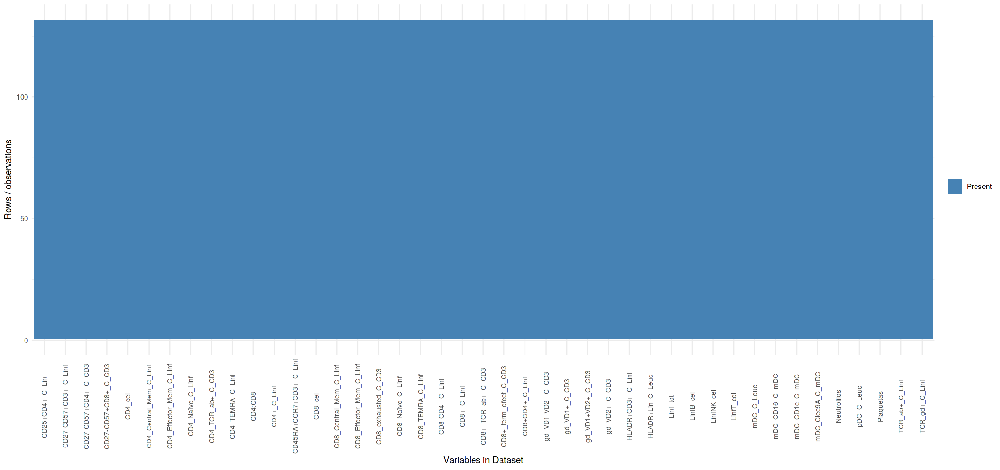

In [6]:
options(repr.plot.width=17, repr.plot.height = 8)
missing_by_column <- X %>% 
    is.na %>% # check if each cell is na
    as_tibble %>% # convert to data-frame
    mutate(row_number = 1:nrow(.)) %>% # add a column with the row number
    gather(variable, is_missing, -row_number) # turn wide data into narrow data

g1 <- ggplot(missing_by_column, aes(x = variable, y = row_number, fill = is_missing)) +
    geom_tile() + 
    theme_minimal() +
    scale_fill_manual(name = "",
        values = c('steelblue', 'tomato3'),
        labels = c("Present", "Missing")) +
    theme(axis.text.x  = element_text(angle=90, vjust=0.5, size = 8)) + 
    labs(x = "Variables in Dataset",
         y = "Rows / observations")
g1

No hay datos faltantes 💃

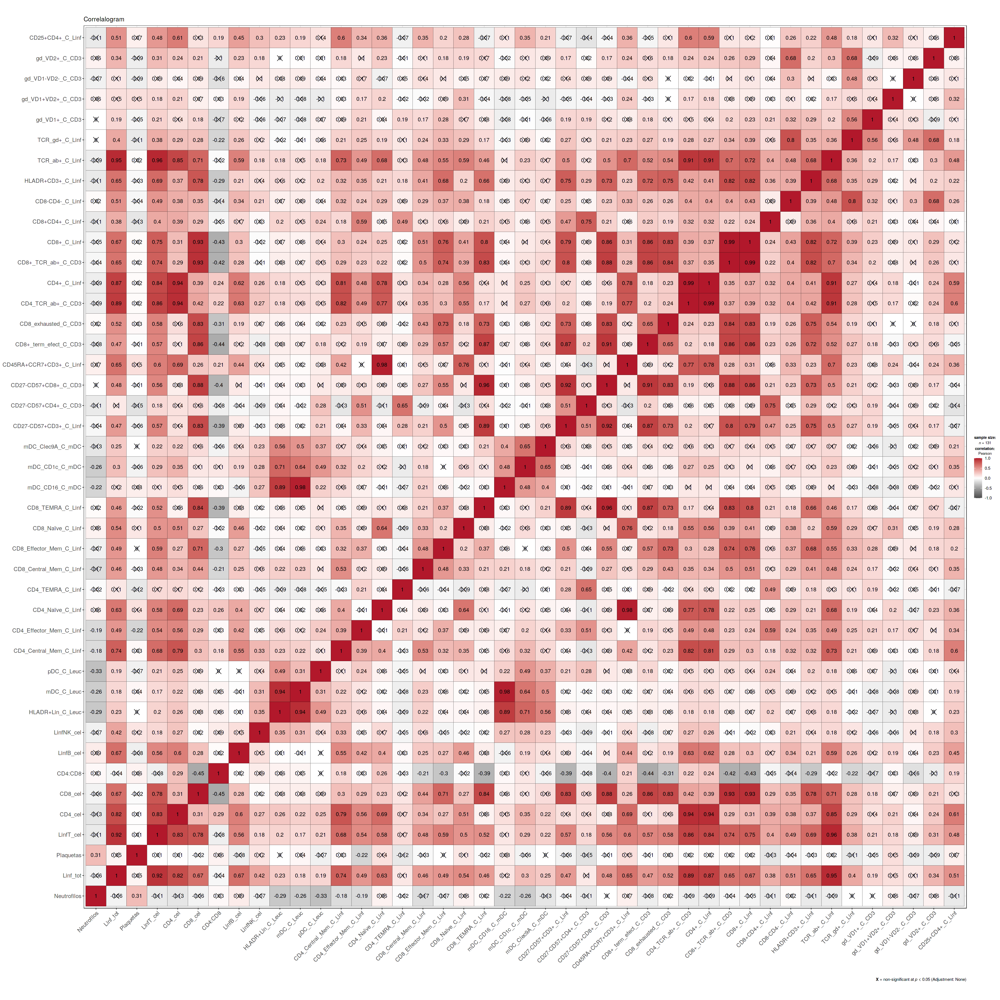

In [7]:
options(repr.plot.width=30, repr.plot.height=30)
ggcorrmat(
  data = X,
  ggstatsplot.layer = FALSE,
  colors = c( "#4D4D4D", "white", "#B2182B"),
  title = "Correlalogram"
)

## PCA

In [8]:
res.pca = PCA(X, scale.unit = TRUE, graph = FALSE, ncp = 30)

### Varianza explicada

En el gráfico siguiente vemos la varianza explicada por las componentes principales.

In [9]:
res.pca$eig[1:26,]

,eigenvalue,percentage of variance,cumulative percentage of variance
comp 1,13.4939109,31.3811881,31.38119
comp 2,6.0344070,14.0335046,45.41469
comp 3,4.1456889,9.6411370,55.05583
comp 4,2.9120293,6.7721611,61.82799
comp 5,2.2915339,5.3291486,67.15714
comp 6,1.7070996,3.9699990,71.12714
comp 7,1.3542543,3.1494286,74.27657
comp 8,1.2858169,2.9902719,77.26684
comp 9,1.0962226,2.5493548,79.81619
comp 10,0.9889412,2.2998634,82.11606


Con las 3 primeras componentes conseguimos explicar un 44.6% de la varianza. No es hasta la componente 26 que conseguimos explicar un 95% de la varianza.

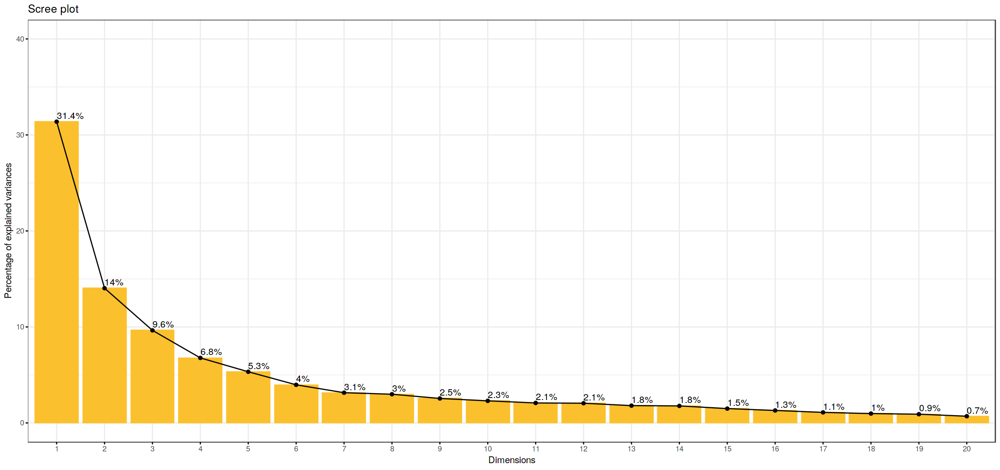

In [10]:
options(repr.plot.width=17, repr.plot.height = 8)
fviz_eig(res.pca, addlabels=TRUE, barfill  = '#FBC02D', barcolor = '#FBC02D', ylim = c(0, 40), ncp = 20, ggtheme = theme_bw())

### T2-Hotelling

The $T^2$ statistic is a summary of all the scores $t_i$ in all the A dimensions. $T^2$ is the distance from the center of the hyperplane to the projection of the observation onto the hyperplane. An observation that projects onto the model’s center. Usually the observation where every value is at the mean, has $T^2=0$. Fun fact; the $T^2$ statistic is the Mahalanobis distance from a projection to the mean.

$$T_i^2 = \sum_{a = 1}^{a = A} (\frac{t_{i,a}}{s_a})^2$$

<br>

Where $A$ is the total amount of components and $s_a^2$ is the $\sigma^2$ for each component. In pca $s_a^2 = \lambda_a$.

The $T^2$ statistic is distributed according to the F-distribution. For example, we can calculate the 99% confidence limit for $T^2$, below which we expect, under normal conditions, to locate 99% of the observations. Then, an observation with $T_i$ will be above the limit when:

$$T_i^2 > F_{A, N-A}^{\alpha = 0.05} \; \frac{A \; (N^2 - 1)}{N (N - A)}$$

<br>

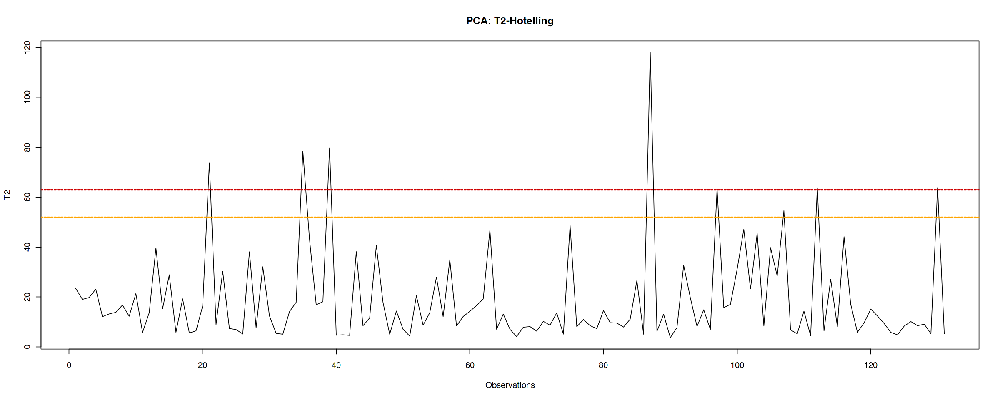

In [11]:
options(repr.plot.width=20, repr.plot.height=8)
# T2-Hotelling (para X)
misScores = res.pca$ind$coord[,1:19]
varT = apply(misScores, 2, var)
miT2 = colSums(t(misScores**2) / varT)
N = nrow(X)
A = 26
F95 = A*(N**2 - 1)/(N*(N - A)) * qf(0.95, A, N-A)
F99 = A*(N**2 - 1)/(N*(N - A)) * qf(0.99, A, N-A)
plot(1:length(miT2), miT2, type = "l", xlab = "Observations", ylab = "T2",
     main = "PCA: T2-Hotelling")
abline(h = F95, col = "orange", lty = 2, lwd = 2)
abline(h = F99, col = "red3", lty = 2, lwd = 2)

Existen 5 observaciones con un $T^2$ significativo. Veamos cuáles son;

In [12]:
names(miT2[which(miT2>F99)])

[1] "21"  "35"  "39"  "87"  "97"  "112" "130"

### Interpretando las 3 primeras componentes

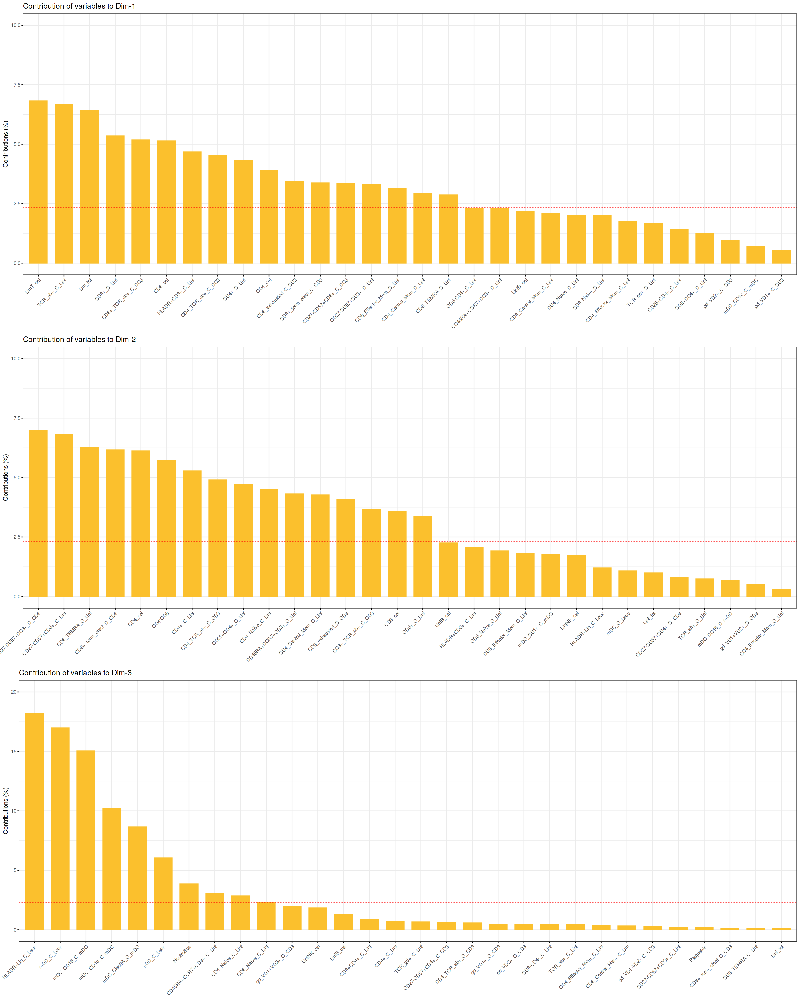

In [13]:
options(repr.plot.width=20, repr.plot.height=25)
d1 <- fviz_contrib(res.pca, choice = "var", axes = 1, fill  = '#FBC02D', color = '#FBC02D', top = 30, ylim = c(0, 10), ggtheme = theme_bw())
d2 <- fviz_contrib(res.pca, choice = "var", axes = 2, fill  = '#FBC02D', color = '#FBC02D', top = 30, ylim = c(0, 10), ggtheme = theme_bw())
d3 <- fviz_contrib(res.pca, choice = "var", axes = 3, fill  = '#FBC02D', color = '#FBC02D', top = 30, ylim = c(0, 20), ggtheme = theme_bw())
grid.arrange(d1, d2, d3, nrow=3)

Las variables que más contribuyen a la 1ra componente parecen ser las de CD8, CD27. En la segunda componente las que más influyen son las CD4. En la componente 3 las que más influyen son las de HLADR, mdC. No sé cómo interpretar cada componente.

### Loadings

#### Dim 1-2

Las variables CD4 parecen ser un grupo bien diferenciado, también las CD8.

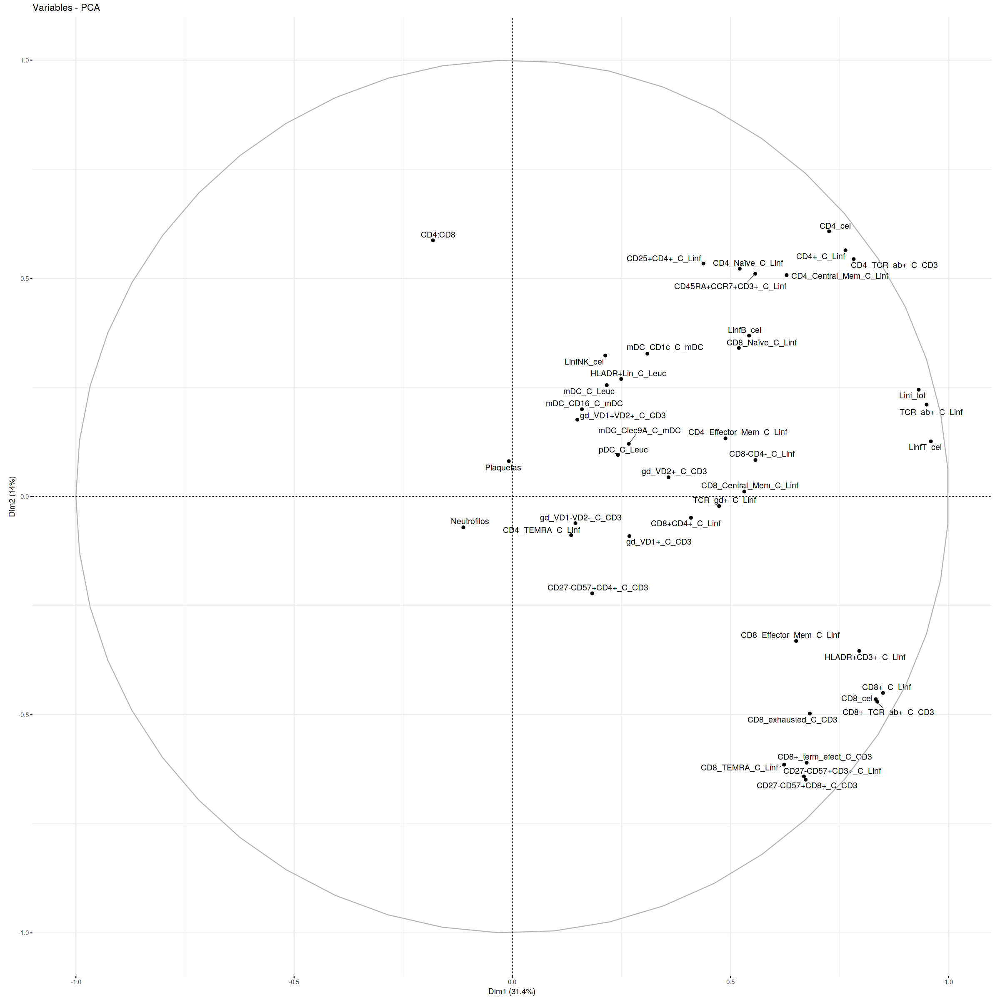

In [14]:
# percentage_o_no
options(repr.plot.width=20, repr.plot.height=20)
#fviz_pca_var(res.pca, axes = c(1, 2), repel = TRUE, col.var = percentage_o_no, geom = c("point", "text"))
fviz_pca_var(res.pca, axes = c(1, 2), repel = TRUE, geom = c("point", "text"))

#### Dim 1-3

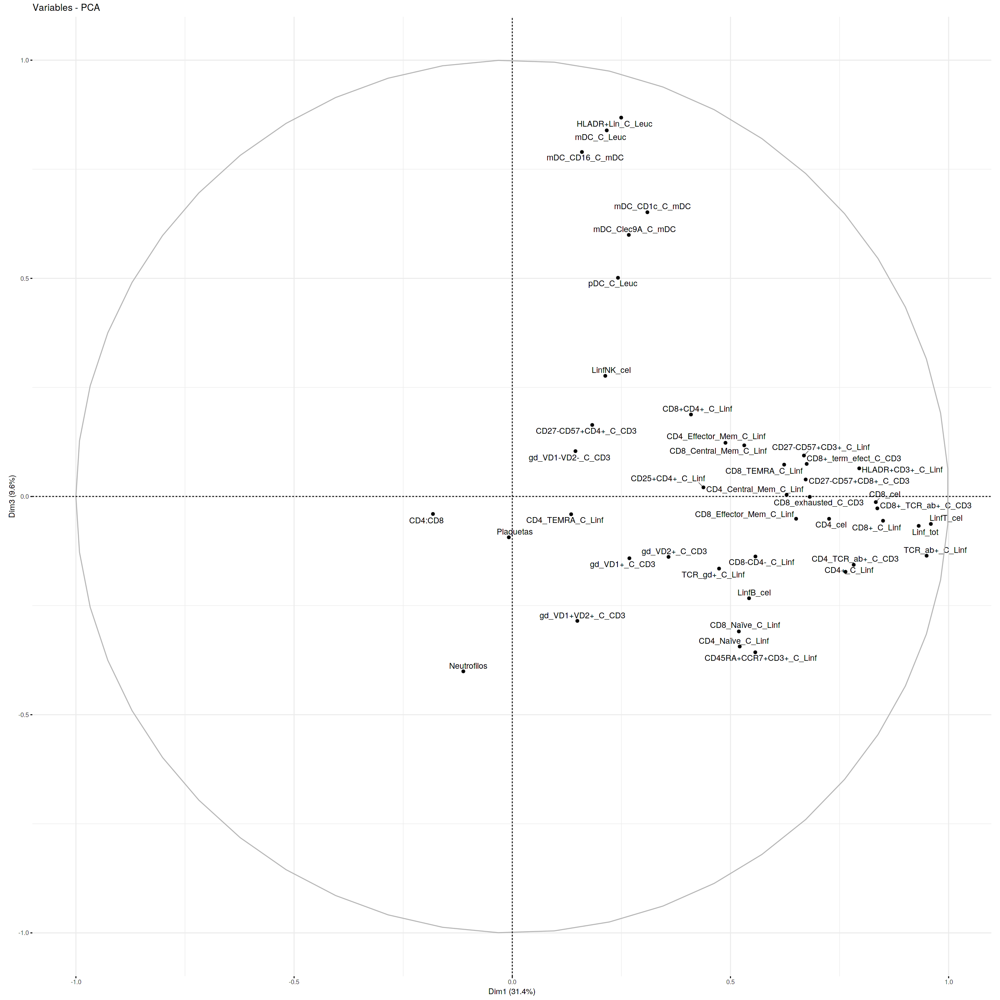

In [15]:
options(repr.plot.width=20, repr.plot.height=20)
#fviz_pca_var(res.pca, axes = c(1, 3), repel = TRUE, col.var = percentage_o_no, geom = c("point", "text"))
fviz_pca_var(res.pca, axes = c(1, 3), repel = TRUE, geom = c("point", "text"))

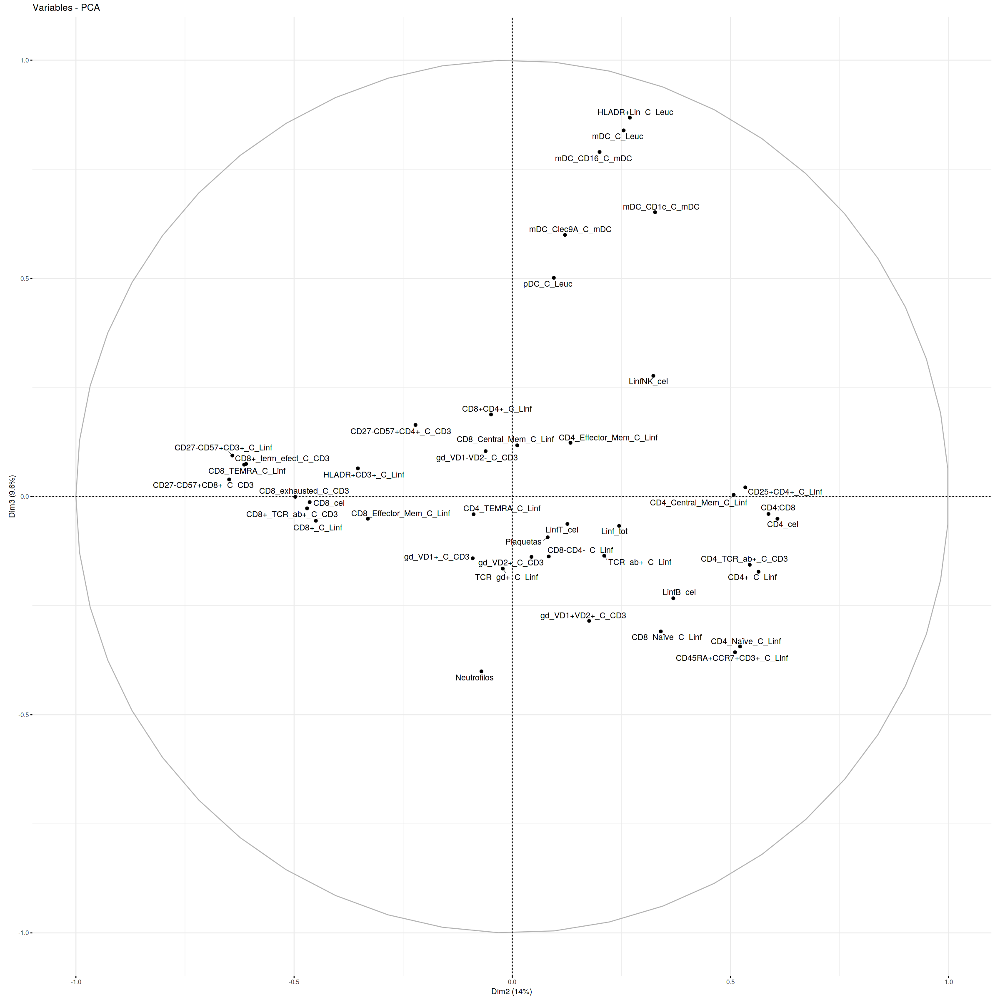

In [16]:
options(repr.plot.width=20, repr.plot.height=20)
#fviz_pca_var(res.pca, axes = c(2, 3), repel = TRUE, col.var = percentage_o_no, geom = c("point", "text"))
fviz_pca_var(res.pca, axes = c(2, 3), repel = TRUE, geom = c("point", "text"))

Existen bloques de variables muy correlacionadas ---> El clustering se debería hacer sobre las componentes principales

### Scores

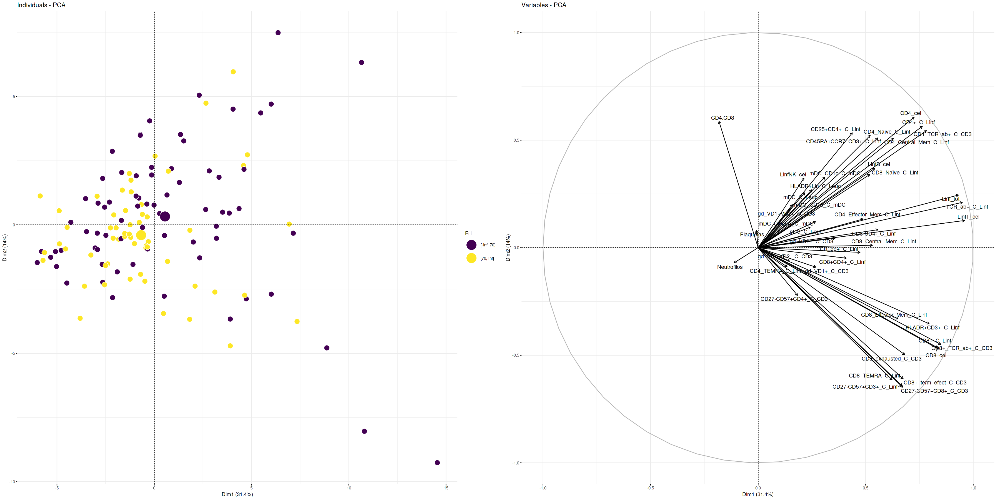

In [17]:
options(repr.plot.width=30, repr.plot.height=15)
edades <- bin_data(data$Edad_dx, bins=c(-Inf, 70, Inf), binType = "explicit")
g1 <- fviz_pca_ind(res.pca, axes = c(1, 2),
                geom.ind = "point",
                fill.ind = edades,
                col.ind = "white",
                pointshape = 21, pointsize = 5,
)

g2 <- fviz_pca_var(res.pca, axes = c(1, 2), repel = TRUE)
grid.arrange(g1, g2, nrow = 1)

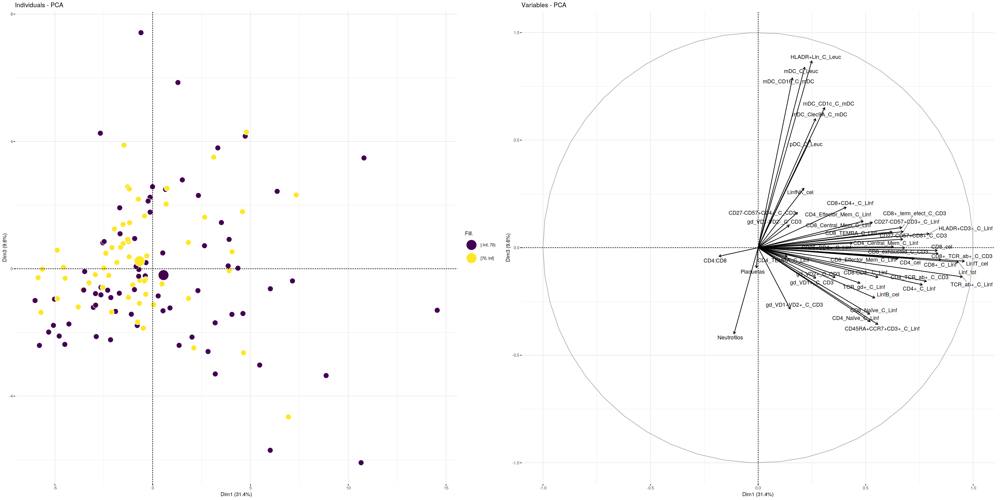

In [18]:
g1 <- fviz_pca_ind(res.pca, axes = c(1, 3),
                geom.ind = "point",
                fill.ind = edades,
                col.ind = "white",
                pointshape = 21, pointsize = 5,
)

g2 <- fviz_pca_var(res.pca, axes = c(1, 3), repel = TRUE)
grid.arrange(g1, g2, nrow = 1)

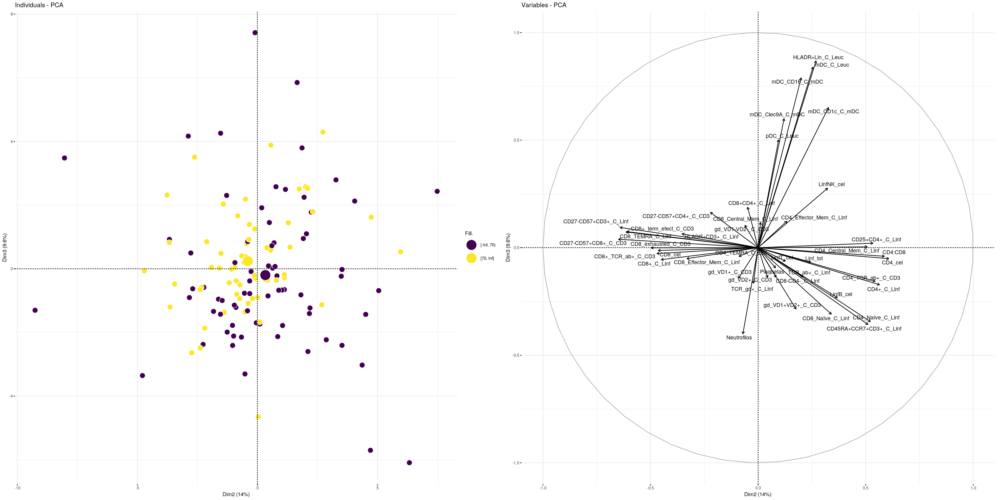

In [19]:
g1 <- fviz_pca_ind(res.pca, axes = c(2, 3),
                geom.ind = "point",
                fill.ind = edades,
                col.ind = "white",
                pointshape = 21, pointsize = 5,
)

g2 <- fviz_pca_var(res.pca, axes = c(2, 3), repel = TRUE)
grid.arrange(g1, g2, nrow = 1)

In [20]:
g <- plot_ly(as.data.frame(res.pca$ind$coord), x = ~Dim.1, y = ~Dim.2, z = ~Dim.3, mode="markers", type="scatter3d", color = edades)
g

Warning message:
“`arrange_()` was deprecated in dplyr 0.7.0.
Please use `arrange()` instead.
See vignette('programming') for more help
This warning is displayed once every 8 hours.
Call `lifecycle::last_warnings()` to see where this warning was generated.”


HTML widgets cannot be represented in plain text (need html)

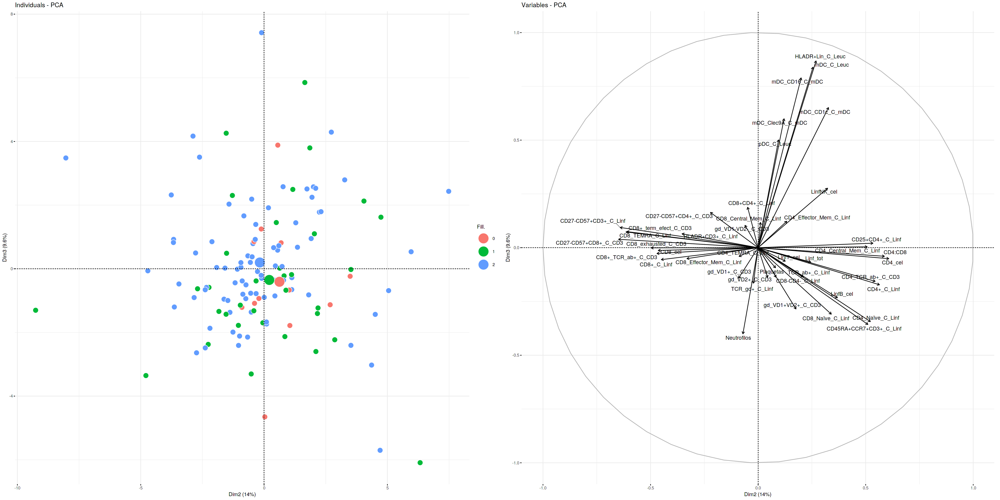

In [21]:
g1 <- fviz_pca_ind(res.pca, axes = c(2, 3),
                geom.ind = "point",
                fill.ind = as.factor(data$Hab_tabaq),
                col.ind = "white",
                pointshape = 21, pointsize = 5,
)

g2 <- fviz_pca_var(res.pca, axes = c(2, 3), repel = TRUE)
grid.arrange(g1, g2, nrow = 1)

#### Atípicos en los scores

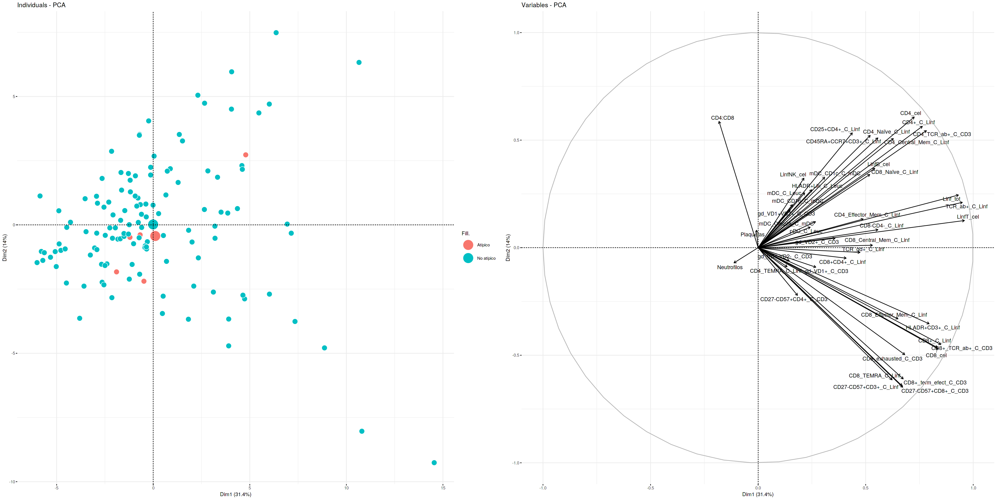

In [22]:
atipical <- ifelse(rownames(data) %in% c('8', '36', '40', '88', '113'), 'Atípico', 'No atípico')

g1 <- fviz_pca_ind(res.pca, axes = c(1, 2),
                geom.ind = "point",
                fill.ind = atipical,
                col.ind = "white",
                pointshape = 21, pointsize = 5,
)

g2 <- fviz_pca_var(res.pca, axes = c(1, 2), repel = TRUE)
grid.arrange(g1, g2, nrow = 1)

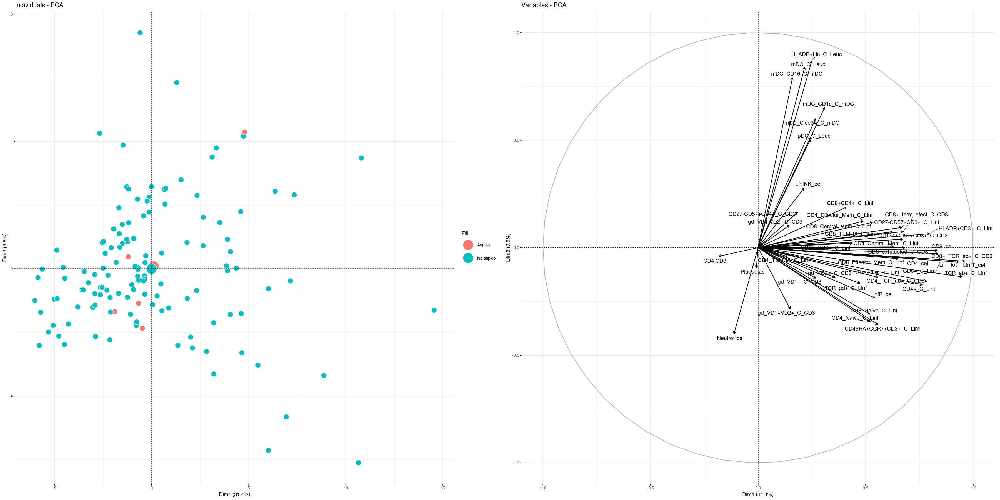

In [23]:
g1 <- fviz_pca_ind(res.pca, axes = c(1, 3),
                geom.ind = "point",
                fill.ind = atipical,
                col.ind = "white",
                pointshape = 21, pointsize = 5,
)

g2 <- fviz_pca_var(res.pca, axes = c(1, 3), repel = TRUE)
grid.arrange(g1, g2, nrow = 1)

In [24]:
write.csv(res.pca$ind$coord, 'Componentes.csv')

In [25]:
install.packages('xlsx')
library("xlsx")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘rJava’, ‘xlsxjars’




In [26]:
write.xlsx(res.pca$ind$coord[,1:19], file = "pca.xlsx")